In [1]:
import glob
import pandas as pd
import json
fileList = glob.glob("/media/ayush/DATA/Codes/yearbook/data_raw/*.txt")
fileList 

['/media/ayush/DATA/Codes/yearbook/data_raw/170001.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170002.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170003.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170004.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170006.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170009.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170010.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170011.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170013.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170014.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170015.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170017.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170018.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170021.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170022.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170023.txt',
 '/media/ayush/DATA/Codes/yearbook/data_raw/170024.txt',
 '/media/ayush/DATA/Codes/yearb

In [2]:
uselessRolls = []
uselessFileList = []
usefulRolls = []
usefulFileList = []
for file in fileList:
    with open(file, 'rb') as f:
        content = f.read()
    if (content == b"b'{}'"):
        uselessRolls.append(file[-10:-4])
        uselessFileList.append(file)
    else:
        usefulRolls.append(file[-10:-4])
        usefulFileList.append(file)

In [3]:
print("Number of people who did not make an account: ", len(uselessRolls))

Number of people who did not make an account:  0


In [4]:
getIds = {}
emailIds = {}
nameIds = {}
for file in usefulFileList:
    print(file)
    with open(file,'rb') as f:
        loadedFile = f.read()
    decoded_string = loadedFile.decode('unicode_escape').encode('latin1').decode('utf8')[3:-2]
    loadedJSON = json.loads(decoded_string)
    getIds[loadedJSON['_id']] = int(loadedJSON['roll'])
    emailIds[loadedJSON['roll']] = (loadedJSON['other'])
    nameIds[loadedJSON['name']] = (loadedJSON['roll'])

/media/ayush/DATA/Codes/yearbook/data_raw/170001.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170002.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170003.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170004.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170006.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170009.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170010.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170011.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170013.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170014.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170015.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170017.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170018.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170021.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170022.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170023.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170024.txt
/media/ayush/DATA/Codes/yearbook/data_raw/170026.txt
/media/ayush/DATA/Codes/yearbook/data_raw/1700

In [5]:
import pickle 

dump_emailsF = open("/media/ayush/DATA/Codes/yearbook/data_emails.pkl", "wb"); pickle.dump(emailIds, dump_emailsF); dump_emailsF.close()
dump_emailsF = open("/media/ayush/DATA/Codes/yearbook/data_emails.pkl", "rb"); emailIds = pickle.load(dump_emailsF); print(emailIds)
dump_IdsF = open("/media/ayush/DATA/Codes/yearbook/data_ids.pkl", "wb"); pickle.dump(emailIds, dump_IdsF); dump_IdsF.close()
dump_IdsF = open("/media/ayush/DATA/Codes/yearbook/data_ids.pkl", "rb"); getIds = pickle.load(dump_IdsF); print(getIds)
dump_namesF = open("/media/ayush/DATA/Codes/yearbook/data_names.pkl", "wb"); pickle.dump(nameIds, dump_namesF); dump_namesF.close()
dump_namesF = open("/media/ayush/DATA/Codes/yearbook/data_names.pkl", "rb"); nameIds = pickle.load(dump_namesF); print(nameIds)

{'170001': 'aaishiashirbad@gmail.com', '170002': 'ubbabrise@gmail.com', '170003': 'aakarsh2299@gmail.com', '170004': 'aakashkhandelwal3021@gmail.com', '170006': 'aamir.makki@gmail.com', '170009': 'ayush26saini@gmail.com', '170010': 'aayusharma27@gmail.com', '170011': 'abhatamrakar2016@gmail.com', '170013': 'abhayvar123@gmail.com', '170014': 'abhijaatk@gmail.com', '170015': 'abhijeetnirmal007@gmail.com', '170017': 'abiiankit@gmail.com', '170018': 'abhinavbende619@gmail.com', '170021': 'abhishekanand6527@gmail.com', '170022': 'abhishekbhatia84@gmail.com', '170023': 'gup.abhi1998@gmail.com', '170024': 'abhishek.gupta748839@gmail.com', '170026': 'ak3605424@gmail.com', '170027': 'amaddheshiya44@gmail.com', '170031': 'abhi291099@gmail.com', '170033': 'abhisheksinghtindal@gmail.com', '170034': 'abhi5august@gmail.com', '170036': 'abhishake.yadav.iitk@gmail.com', '170039': 'pandey.abhyuday07@gmail.com', '170041': 'achyutverma9@gmail.com', '170042': 'adesh00719@gmail.com', '170044': 'adityamoond

In [6]:
userWiseMemoirs = {}
for id_ in getIds.keys():
    userWiseMemoirs[id_] = []
print(userWiseMemoirs)

userWiseNamedMemoirs = {}
for name_ in nameIds.keys():
    userWiseNamedMemoirs[name_] = []
print(userWiseNamedMemoirs)

for file in usefulFileList:
    print(file)
    with open(file, 'rb') as f:
        loadedFile = f.read()
    decoded_string = loadedFile.decode('unicode_escape').encode('latin1').decode('utf8')[3:-2]
    loadedJSON = json.loads(decoded_string)
    member_id = loadedJSON['_id']
    member_name = loadedJSON['name']
    print(loadedJSON)
    for memoir in loadedJSON['comments']:
        memoir.update({'recipient_name': member_name})
        print(memoir)
        if memoir['author'] in userWiseNamedMemoirs.keys():
            userWiseNamedMemoirs[memoir['author']].append(memoir)
        else:
            userWiseNamedMemoirs.update({memoir['author']: [memoir]})

{'170001': [], '170002': [], '170003': [], '170004': [], '170006': [], '170009': [], '170010': [], '170011': [], '170013': [], '170014': [], '170015': [], '170017': [], '170018': [], '170021': [], '170022': [], '170023': [], '170024': [], '170026': [], '170027': [], '170031': [], '170033': [], '170034': [], '170036': [], '170039': [], '170041': [], '170042': [], '170044': [], '170045': [], '170046': [], '170047': [], '170049': [], '170050': [], '170051': [], '170052': [], '170054': [], '170056': [], '170058': [], '170060': [], '170067': [], '170069': [], '170070': [], '170071': [], '170072': [], '170073': [], '170075': [], '170077': [], '170078': [], '170080': [], '170081': [], '170082': [], '170085': [], '170086': [], '170087': [], '170088': [], '170096': [], '170097': [], '170099': [], '170101': [], '170102': [], '170103': [], '170104': [], '170105': [], '170107': [], '170108': [], '170109': [], '170110': [], '170111': [], '170113': [], '170114': [], '170116': [], '170117': [], '1701

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [7]:
userWiseNamedMemoirs

{'Aaishi  Ashirbad': [{'text': 'yo bende|har lab ke saathi,\nkaafi positive banda hai tu..har lab kya..har jagah saath mein the hum..pe ground..class..tere se humesha lab report dekhna xD..tere saath bas volleyball nhi khel paaya..crescendo yaad hai..xD kaafi aage tu jaayega..all the best for future...milte rhenge',
   'author': 'Aaishi  Ashirbad',
   'visibility': True,
   '_id': '60c221d2659165b3aa645967',
   'recipient_name': 'Abhinav  Bende'},
  {'text': 'yo pandey|nangu boy| gym dude..xD\nbht mehnat karta hai be tu...humesha wing mein chadda pe ghumta hai bsdk xD..regular gym jaata tha...tera dedication mast tha bhai...volleyball ke time madhesiya aur tumhari jodi humesha yaad rhega...dudhusiya and pandu gandu..xD xD....tu aage bht chaapega...milte rhenge..',
   'author': 'Aaishi  Ashirbad',
   'visibility': True,
   '_id': '60c2395c659165b3aa645bc0',
   'recipient_name': 'Aman  Pandey'},
  {'text': 'Aur meethe| dassa odia boy\nJitna bhi bataun tere baarein mein kam hi pad jaayega

In [8]:
import pandas as pd
for name_ in nameIds:
    contentName = userWiseNamedMemoirs[name_]
    df_ =  pd.DataFrame(contentName)
    print(name_)
    df_.to_csv('/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/{}.csv'.format(name_))

Aaishi  Ashirbad
Aaiyush  Kapurwan
Aakarsh  Singh
Aakash  Khandelwal
Aamir Ahmad Makki
Aayush  Saini
Aayush  Sharma
Abha  Tamrakar
Abhay  Varshney
Abhijaat Ashish Kotamkar
Abhijeet
Abhinav  Ankit
Abhinav  Bende
Abhishek  Anand
Abhishek  Bhatia
Abhishek Gupta (N K Gupta)
Abhishek  Gupta
Abhishek  Kumar
Abhishek  Maddheshiya
Abhishek  Sharma
Abhishek Singh Tindal
Abhishek  Soni
Abhishek Yadav (R S Yadav)
Abhyuday  Pandey
Achyut Kumar Verma
Adesh  Shukla
Aditya
Aditya Abhaykirti Paikrao
Aditya  Gulati
Aditya  Gupta
Aditya  Kalsha
Aditya  Mishra
Aditya Narayan Sarkar
Aditya  Raghuwanshi
Aditya  Sharma
Aditya  Singh
Aditya Singh Rathore
Aditya  Sonthalia
Akash  Gangwar
Akash  Kumar
Akhilesh  Chauhan
Akshat  Agrawal
Akshat  Tiwari
Akshay
Akshit  Sharma
Alan  Nair
Ali  Faraz
Aman  Garg
Aman  Gautam
Aman  Jangid
Aman  Pandey
Aman  Raj
Aman Raj Singh
Aman  Saraf
Amitesh  Sachan
Amrendra Pratap Singh
Anant  Agarwal
Anant  Sinha
Ananta  Mukherjee
Anany  Sharma
Ananya  Goswami
Anchal  Singh
Aniket

In [9]:
# creating large dataset
import glob
fileList = glob.glob("/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/*.csv")
print(fileList)
dfs = []
for file in fileList:
    print(file)
    dfs.append(pd.read_csv(file))

['/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Neil Rajiv Shirude.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aaishi  Ashirbad.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aaiyush  Kapurwan.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aakarsh  Singh.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aakash  Khandelwal.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aamir Ahmad Makki.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aayush  Ostwal.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aayush  Saini.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Aayush  Sharma.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Abha  Tamrakar.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Abhay  Varshney.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Abhijaat Ashish Kotamkar.csv', '/media/ayush/DATA/Codes/yearbook/personWiseMemoirs/Abhijeet.csv', '/media/ayush/DATA/Codes/yearb

In [10]:
totalDf = pd.concat(dfs, axis=0)
totalDf.to_csv('/media/ayush/DATA/Codes/yearbook/allConfessions.csv')

In [11]:
import glob
fileList = glob.glob('/media/ayush/DATA/Codes/yearbook/chhaatr-khoj/data/*')
genderMapping = {}
for file in fileList:
    f = open(file, "r")
    file_contents = f.read().split()
    roll_number = file_contents[0]
    gender = file_contents[-1]
    genderMapping[roll_number] =  gender
genderMappingF = open("/media/ayush/DATA/Codes/yearbook/data_gender.pkl", "wb"); pickle.dump(genderMapping, genderMappingF); genderMappingF.close()
genderMappingF = open("/media/ayush/DATA/Codes/yearbook/data_gender.pkl", "rb"); genderMapping = pickle.load(genderMappingF); print(genderMapping)

rollNameMapping = {}
for k, v in nameIds.items():
    rollNameMapping[v] = k

df = totalDf
df['author_roll'] = df['author'].map(nameIds)
df['recipient_roll'] = df['recipient_name'].map(nameIds)
df['author_gender'] = df['author_roll'].map(genderMapping)
df['recipient_gender'] = df['recipient_roll'].map(genderMapping)
totalDf = df
totalDf.to_csv('/media/ayush/DATA/Codes/yearbook/allConfessions.csv')

{'10017': 'M', '10029': 'M', '10032': 'M', '10047': 'M', '10053': 'M', '10088': 'M', '10100063': 'F', '10101061': 'M', '10101062': 'M', '10101065': 'M', '10101066': 'M', '10102043': 'M', '10102068': 'M', '10102073': 'M', '10103003': 'F', '10103027': 'M', '10103031': 'M', '10103046': 'M', '10103058': 'M', '10103066': 'M', '10103069': 'F', '10103071': 'M', '10103074': 'M', '10103076': 'M', '10103078': 'M', '10104044': 'M', '10104055': 'M', '10104073': 'M', '10104110': 'M', '10104121': 'M', '10104122': 'M', '10104123': 'M', '10104125': 'M', '10104126': 'M', '10105': 'M', '10105031': 'M', '10105039': 'M', '10105089': 'M', '10105099': 'M', '10105130': 'M', '10105133': 'M', '10105134': 'M', '10105136': 'M', '10105144': 'M', '10105145': 'M', '10105149': 'M', '10106010': 'F', '10106012': 'M', '10106016': 'M', '10106027': 'M', '10106061': 'M', '10106066': 'F', '10106070': 'F', '10106075': 'M', '10107065': 'M', '10107067': 'M', '10107079': 'F', '10107084': 'M', '10107088': 'M', '10107089': 'M', 

# Hehe fun

In [12]:
import pandas as pd
pd.set_option('display.max_colwidth', None)
df = pd.read_csv('/media/ayush/DATA/Codes/yearbook/allConfessions.csv')
df = df.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1)
df[df.visibility==False].to_csv('/media/ayush/DATA/Codes/yearbook/hiddenConfessions.csv')
print(df.shape)
df.head(1)

(13789, 9)


,text,author,visibility,_id,recipient_name,author_roll,recipient_roll,author_gender,recipient_gender
0,"Yoo Abha (bachcho ne ye naam rakha tha tera lol) \nThis is definitely the toughest memoir that I am going to write.\nWing, Humanoid, Takneek, Roboclub, H205 - in sab ke saath kitni achchi memories judi hai apni. \nOrientation ke time tu wing ka sabse energetic aur enthu wala banda laga tha mujhe. Aur ye reputation tune jald hi waapas gain kar liya tha.\nHumanoid team ke liye tera dedication alag level tha bhai. From my point of view, ek time aisa tha jab Humanoid team was mainly Abhay Varshney. Is point se waapas team build karne mein tera hi sabse bada contribution tha. Team ko South Korea leke jaane mein bhi tera hi sabse bada (technical aur non-technical dono) contribution tha hi. Sabhi ne give up kar diya tha, tab bhi tu data raha, aur end mein funds collect ar hi liye! Itna persistence kisi mein nahi hota bhai. Iske liye massive respect hai tere liye.\n2nd year Takneek ke time teri Hall feel bohot paas se dekhi maine. HEC ki post chod ke Hall Captain banne ki soch raha tha tu, itna man tha tera Takneek jeetane ka. Raat raat bhar jagke bachcho ke saath baith ke bots banwaaye the tune. Yahi sab dekh ke to Y18 ke laundo mein hall feel aayi hogi!\nRoboclub mein bhi you ‘led by example’. Mainly teri wajah se hi maine renom mein apply kiya tha (you may not agree here XD) Summers mein 3-legged jumping robot ke bachcho ko ek point pe pyaar ho gaya tha tujhse <3 Tech Meet ke bot pe bhi tune god-level kaam kiya, aur karwaya. Dedication aur persistence - you personify these qualities. You completely deserve the SnT Excellence Award!\nI know I wasn’t the best of all room-mates, par haan, maine bhi kaafi grow kiya hai personally H205 mein. It got over extremely abruptly though.\nMaze bhi bohot kiye hai apan ne, aur tere bohot maze bhi liye hai. Tere Dilbar dance ki video banaane ko tu dhoka maanta hai, par mai usko farz maanta hu. Ye maine tujhe bohot baar bola hai- “Agar tu sirf dost hota to mai video nahi banaata, par tu bohot achcha dost hai isliye maine video banayi”\nTu Bangalore, mai Mumbai aur Jay Gurgaon - could things get any worse? \nPar milte hai bhai jald hi. All the Best!\nLove you bro <3",Neil Rajiv Shirude,True,60c20145659165b3aa645783,Abhay Varshney,170429,170013,M,M


In [13]:
df[(df.visibility==True) & (df.author=="Yash  Maheshwari")]

,text,author,visibility,_id,recipient_name,author_roll,recipient_roll,author_gender,recipient_gender
13028,"Yo bhai!\n\nSecond year me mila tha first time tujhse EE courses plus Tarish ki wajah se. Pura 2nd year was lit waise, tere room ke cooler me baithke PUBG khelte rehte the XD. Kaafi straightfoward banda hai tu plus baat karne me bhi maza aata tha hamesha. Aisa hi lit banda rehna always and wapas kabhi pubg khelte hai saath me. Best of luck :)",Yash Maheshwari,True,60bf592d659165b3aa6450ac,Abhinav Ankit,170817,170017,M,M
13029,"Yo Moond!\n\nI guess pehli baar Tarish ke room pe mile the first year me, uske baad se to second year me pure time tumhari wing me hi rehta tha PUBG khelte hue. Us pure time bas ek hi cheez sunai deti thi tere baare me har jagah se: Moond Logic lol. But jokes apart lit banda hai bhai tu, ekdum franly baat karta hai which is one of the good things about you imo. Will remember saare lit pubg matches and badhiya convos that we had irl or in that messenger group. Hope aage kabhi mil paaye wapas! :)",Yash Maheshwari,True,60bf51a4659165b3aa6450a6,Aditya,170817,170044,M,M
13030,"Yo Gulati!\n\nI guess we first met through Astro and uske baad se was a lit experience with you throughout the Astro journey. Aur bhi log likh chuke hai ye but you are definitely one of the smartest and humblest people I have met on campus. Kaafi maza aaya tha sath me kaam karne me on that lecture we gave on the birth of the universe, really wish aur kaam kar paate sath me and hope you also enjoyed that time. Let's talk or meet sometime again and be the great person that you are :)",Yash Maheshwari,True,60bf5341659165b3aa6450a8,Aditya Gulati,170817,170046,M,M
13032,"Yo Brooo!!\n\nWaise kaafi log likh chuke hai ye tere baare me but you are definitely one of the nicest and humblest people I've met on campus. I always remember mera EE ke courses ke liye tere paas aakar rona and all of the other nice conversations that we had. Kaafi sahi and chill banda hai tu bro, stay like that always and best of luck! Hope ki can meet you again someday :)",Yash Maheshwari,True,60bf5a02659165b3aa6450ae,Akhilesh Chauhan,170817,170070,M,M
13033,"Yo God!\n\nPehli baar jab pata chala tha Soumya se ki Anany Sharma IITK aaya hai, to tujhse milne aaya tha tab hall 2, uske baad bhi kaafi baar mile and hamesha maza aata tha baat karke. Waise tabse mobile me number Anany God ke naam se hi saved hai jaisa Soumya ne forward kiya tha lol. Kaafi fun loving aur chill bande lagte ho bhai tum, hamesha waise hi rehna bro. Wished ki wapas mil paate 4th year me kabhi but college hi nahi aa paaya tha. Hope we meet again sometime! :)",Yash Maheshwari,True,60bf5f62659165b3aa6450bc,Anany Sharma,170817,170103,M,M
...,...,...,...,...,...,...,...,...,...
13099,"Varun bhai!\n\nFirst year me astro me mile the apan first time, badhiya experience tha sath me. Uske baad unexpectedly drams me bhi mil gaye and 2 nukkad bhi kiye sath me (not much but honest work lol). First second year ke baad kaafi alag kaam the to isliye zyada milna nahi hua but usse pehle jitne bhi baar mile, tumhari comedy kaafi badhiya lagti thi. Ekdum mast aur chill insaan lagte the tum. In short maza aaya bhai tumse milkar, best of luck aage ke liye and milte hai kabhi!",Yash Maheshwari,True,60c22028659165b3aa64594b,Varun Jain,170817,170783,M,M
13100,"Tandon bhau/bossman!\n\nBhai first year me wing me milne se lekar abhi apni goa trip tak kaafi baar mile and kaafi lit moments hue sath me. Can't possibly sum up all that in one memoir but want to put this one thing up ki always looked up to you bro! Thanks for everything and milte hai bhau wapas kabhi kisi BB trip pe, baaki messenger to chalta hi rahega hopefully lol",Yash Maheshwari,True,60c224f1659165b3aa6459a2,Vatsalya Tandon,170817,170785,M,M
13101,"Yo bro!\n\nFirst year me mile the apan first time shayad hall me, tab bas ye suna hua tha ki Vipul naam ka ek chaapu banda hai E5 me. Jab mila and baat kiya tha tab pata chala ki chaapu ke sath sath mast banda bh

In [14]:
df.author.value_counts()

Ram  Goyal            195
Mahajan Dipak Anil    139
Chitranshi  Singh     135
Kushagra  Gupta       117
Ananya  Goswami       116
                     ... 
Jitendra  Jakhar        1
Kumar  Shivam           1
Arnav  Goel             1
Sanket  Gaggar          1
Sameer  Yadav           1
Name: author, Length: 503, dtype: int64

In [15]:
a = df[df.author.isin(["Saurabh  Sharma"]) & (df.recipient_gender=='F')]
print(a.shape)
a.to_csv('/media/ayush/DATA/Codes/yearbook/sample.csv')
a

(9, 9)


,text,author,visibility,_id,recipient_name,author_roll,recipient_roll,author_gender,recipient_gender
10872,Hey Abha !\n\nWe have not conversed a lot but heard a lot about you; your awesome nature; and your pleasing character (Just some common friends 😝😝) Vese bhi CS ke log to acche hi hote hai. LOL. So good to be in contact with you. \nAll the best for Future 💙,Saurabh Sharma,True,60a294e1819323d199d47d9e,Abha Tamrakar,170644,170011,M,F
10876,"Hey Zoo ------My Class Room Partner---❤---My Cheating Partner---😅😂 \n\nTwo secrets of this lil' baby - \nFirst - Zoo has a surname - 'Chaudhary', but sarkari kagaj per ghapla hone ki vajah se ye apna surname chupati phirti hai. 👀\n\nSecond - Ye asal me 'Jhunjhunu' ki rehne vali hai, but sabhi ko sharm ke mare aapna hometown 'Jaipur' btati hai. 😛\n\n\nYou are different. Not an easy person. Lots of things go on inside yr head, but nothing comes out. Tough to know you.\n\nConfession:- yar u know, u helped me in ESC201A endsem exam jisme meko kuch ni aata tha. Tere tipane ki vajah se hi I got C (haaash), verna D lagta. US din to bahot pyar aaya tha tujhpe 😛😛😘. Thank you Zoo for all the help in all the exams and courses. 😍🙌\n\nSal bhar rona suna intern ni lagne ke liye. Now, finally, after lots of hard work, you are onboard on American Express. Congrats and All the Best for your Beautiful Future. \n\nPS: Last time teri copy per pen chalana bhi reh gya. !!Will miss you 'Pyare Dost' ✨❤",Saurabh Sharma,True,609e6688819323d199d47aba,Arzoo,170644,170154,M,F
10878,"Hellllllloooooo Mona Da..... 👻\nSaid earlier as well, and vapis keh rha -: I have never found such a good friend like you, and maybe I will never. ittne kam time me, we became so close na yar... just missing it out loud.☹ Project ka kaam to sirf Gangwar karta tha.. ham to ladne aate the LOL. aur ladte ladte ittne acche dost kab ban gye.. pta hi ni chala. Still remember ittne zor se badi bottle se mari thi hath pe, 🙄🙄 our fight is still onnnn.....\n\nAbove all, TYou for making me experience an imp. life lesson which I bet kabhi vapis dekhne ko ni milega 😝😝 I'll put a board near that Hall-12 sofaset jispe likha hoga - "" Isspe please mat bethna, isspe kisi ne......chi chi chi euuuuuuuuuu "" 😛😛 I hope you remember text vala prank 😅😂\n\nWon't forget you ever, my mischievous friend ❤❤ Per ab to meko hate karna band karde yar 🤣🤣\nAnyway, TC. Jaldi hi milenge. 😢 n All the best for your new life. Stay Amazing. 😘😘\n\nचेतावनी ---- ये लड़की मासूम बनके आपसे सारे काम करवा लेती है !! सतर्क रहें, सावधान रहें |",Saurabh Sharma,True,60910b1b819323d199d47752,Monika Rathore,170644,170400,M,F
10882,"Hey Chits: I love calling you by this (the name I invented and hopefully teko pasand bhi aata tha)\n\nQuestion - I bet if you can tell me how did our conversation start. (PAUSE and THINK)\n\nYou know, me GH me pehli bar tere liye hi aaya tha - Your bday celebration - 2nd year summer me and unfortunately vo gift diya which you hated the most 😝🤦‍ Tu kutton se darke, ittne zor se hath pakadti thi na mera... I just started loving dogs 😝😝😝\n\nFor the only one time, ham sath me movie dekhne gye the and dinner bhi kiya tha. Remember the movie name? Also, once u came to the hall and I was playing TT & I got a clean shave .. and your reaction was.. heiinn wtf. LOL 🤣🤣😆😆\nThere are endless such incidents yar.... you made my life filled with events - kuch na kuch chalta hi rehta tha 🤦‍🤣🤣 But i seriously enjoyed it yar ❤❤\n\nFrom nothing to everything... you have changed n gained a lot. Tareef-e-Kabil hai ye bat bahot and I appreciate it deeply. Congratulations Chits for JOB and All the best for your bright future 🎉💞\n\nEmbarrassment :- Antaragni me BC tu to bhand thi.. aur mera hath pakadke informal ground ke gol gol chakkar laga rhe the ham. Sab meko dekhke ishare kar rhe the.. and I was like.. no nooo ye ladki bhand hai...me ni 😑😑\n\nConfession & Answer: - I used to reply from kunal's phone. One day, I told you about your tange looking sexy; aur tu Slounge se uthke chali g

In [16]:
df.groupby('author').count()['text']

author
Aaishi  Ashirbad        17
Aaiyush  Kapurwan       21
Aakarsh  Singh          20
Aakash  Khandelwal      49
Aamir Ahmad Makki        8
                      ... 
Yash  Srivastava         7
Yashika                 52
Yatin  Azad             34
Yogeshwar              104
Yugesh Ajit Kothari     67
Name: text, Length: 503, dtype: int64

In [17]:
df.groupby('recipient_name').count()['text']

recipient_name
Aaishi  Ashirbad       23
Aaiyush  Kapurwan      19
Aakarsh  Singh         30
Aakash  Khandelwal     40
Aamir Ahmad Makki       9
                       ..
Yashika                45
Yatin  Azad            31
Yogesh Kumar Meena     17
Yogeshwar              63
Yugesh Ajit Kothari    57
Name: text, Length: 549, dtype: int64

(array([ 1.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.,
         0.,  2.,  1.,  3.,  3.,  5.,  6.,  2.,  2.,  5.,  6.,  6.,  6.,
        14., 12., 17., 22., 41., 36., 73., 78., 67., 40., 29., 10.,  8.,
         5.]),
 array([-3.4339872 , -3.32929323, -3.22459925, -3.11990528, -3.0152113 ,
        -2.91051733, -2.80582335, -2.70112938, -2.5964354 , -2.49174143,
        -2.38704745, -2.28235348, -2.1776595 , -2.07296553, -1.96827155,
        -1.86357758, -1.7588836 , -1.65418963, -1.54949565, -1.44480168,
        -1.3401077 , -1.23541373, -1.13071975, -1.02602578, -0.9213318 ,
        -0.81663783, -0.71194385, -0.60724987, -0.5025559 , -0.39786192,
        -0.29316795, -0.18847397, -0.08378   ,  0.02091398,  0.12560795,
         0.23030193,  0.3349959 ,  0.43968988,  0.54438385,  0.64907783,
         0.7537718 ]),
 <BarContainer object of 40 artists>)

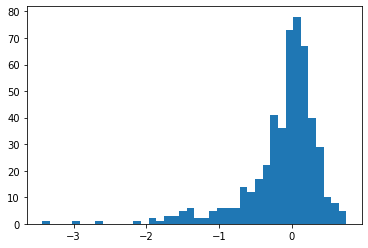

In [18]:
import matplotlib.pyplot as plt
import numpy as np
plt.hist(np.log((df.groupby('author').count()['text']/df.groupby('recipient_name').count()['text']).sort_values(ascending=False)), bins=40)

In [23]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
comment_words = ""

In [24]:
# f = open("/media/ayush/DATA/Codes/yearbook/hinglishStopwords.txt", "r")
# hinglish_stopwords = f.read().split()
# set(hinglish_stopwords)
# stopwords.update(hinglish_stopwords)

In [25]:
for val in df.text:
    # typecaste each val to string
    val = str(val)
    val = val.replace('/n', '')
    # split the value
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "

In [26]:
wordcloud = WordCloud(width = 1600, height = 800,
                background_color ='white',
                stopwords = stopwords,
                collocation_threshold = 3,
                min_font_size = 1).generate(comment_words)

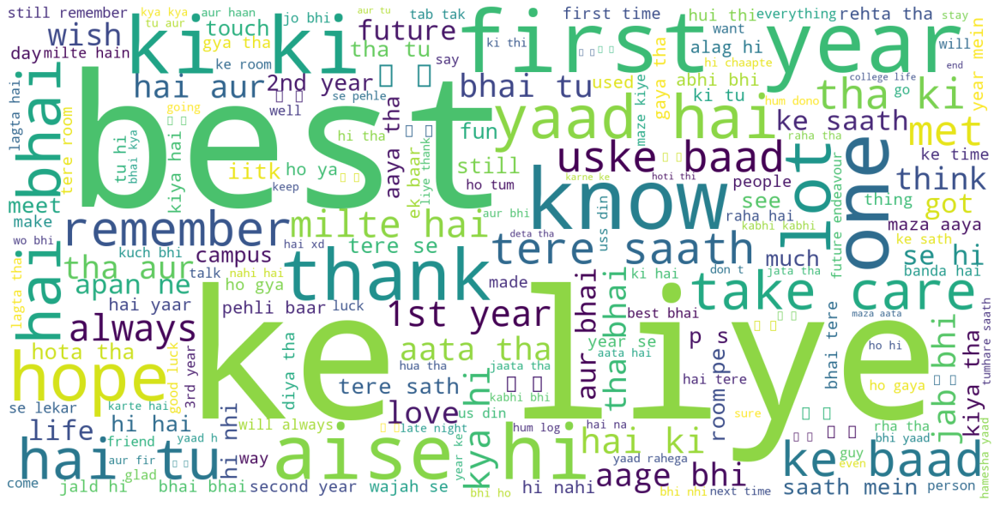

In [27]:
plt.figure(figsize = (16, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

# n-gram analysis

In [28]:


# Packages
import os
import numpy as np
import pandas as pd
import nltk
import random

# Pre-Processing
import string
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re
from nltk.stem import PorterStemmer
from nltk.stem.lancaster import LancasterStemmer
from nltk.stem.porter import *

# Sentiment Analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
import matplotlib.pyplot as plt

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns

# N- Grams
from nltk.util import ngrams
from collections import Counter

# Topic Modeling
from nltk import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation

# Word 2 Vec
from gensim.models import Word2Vec
from sklearn.decomposition import PCA

# Models
import datetime
from nltk import naivebayes

import warnings
warnings.filterwarnings("ignore")



from nltk.stem.lancaster import LancasterStemmer
from nltk.stem.porter import *
#ps = LancasterStemmer()
ps = PorterStemmer()

tokenizer = RegexpTokenizer(r'\w+')
stop_words = set(stopwords.words('english'))

def preprocessing(data):
    txt = data.str.lower().str.cat(sep=' ') #1
    words = tokenizer.tokenize(txt) #2
    words = [w for w in words if not w in stop_words] #3
    #ords = [ps.stem(w) for w in words] #4
    return words

def wordfreqviz(text, x):
    word_dist = nltk.FreqDist(text)
    top_N = x
    rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
    matplotlib.style.use('ggplot')
    rslt.plot.bar(rot=0)

def wordfreq(text, x):
    word_dist = nltk.FreqDist(text)
    top_N = x
    rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
    print(rslt)
    
## Helper Functions
def get_ngrams(text, n):
    n_grams = ngrams((text), n)
    return [ ' '.join(grams) for grams in n_grams]

def gramfreq(text,n,num):
    # Extracting bigrams
    result = get_ngrams(text,n)
    # Counting bigrams
    result_count = Counter(result)
    # Converting to the result to a data frame
    df = pd.DataFrame.from_dict(result_count, orient='index')
    df = df.rename(columns={'index':'words', 0:'frequency'}) # Renaming index column name
    return df.sort_values(["frequency"],ascending=[0])[:num]

def gram_table(gram, length):
    out = pd.DataFrame(index=None)
    for i in gram:
        print(i)
        table = pd.DataFrame(gramfreq(preprocessing(df['text']),i,length).reset_index())
        table.columns = ["{}-Gram".format(i),"Occurence"]
        out = pd.concat([out, table], axis=1)
    return out

/media/ayush/DATA/Codes/builds/ml_env/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [29]:
gram_df = gram_table(gram=[1,2,3,4,5,6,7], length=100)
gram_df

1
2
3
4
5
6
7


,1-Gram,Occurence,2-Gram,Occurence,3-Gram,Occurence,4-Gram,Occurence,5-Gram,Occurence,6-Gram,Occurence,7-Gram,Occurence
0,hai,17200,ke liye,2093,ki ki ki,1359,ki ki ki ki,1356,ki ki ki ki ki,1353,ki ki ki ki ki ki,1350,ki ki ki ki ki ki ki,1347
1,hi,13486,first year,1610,त म ह,216,त म ह र,161,bee movie js revisions 8,130,movie js revisions 8 13 07,130,bee movie js revisions 8 13 07,130
2,ki,12309,ki ki,1374,best luck future,172,js revisions 8 13,130,movie js revisions 8 13,130,bee movie js revisions 8 13,130,baby baby baby baby baby baby baby,108
3,aur,11488,aise hi,1263,aise hi chaapte,165,revisions 8 13 07,130,js revisions 8 13 07,130,baby baby baby baby baby baby,110,tarish tarish tarish tarish tarish tarish tarish,98
4,tha,11358,best future,1027,best future endeavours,164,bee movie js revisions,130,baby baby baby baby baby,112,tarish tarish tarish tarish tarish tarish,99,hope paths meet someday meanwhile best man,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,tak,1448,ke sath,246,kya hi bolu,59,म त म ह,16,could possibly find wing mostly,9,years 2 bot caught us happy,9,2 bot caught us happy bear took,9
96,us,1447,maze kiye,242,hai tere saath,59,bhi ese hi rahna,16,possibly find wing mostly tamonud,9,watch movie also time tamonud treated,9,years 2 bot caught us happy bear,9
97,aa,1426,hi tha,242,yaad aata hai,59,tu aise hi rehna,16,find wing mostly tamonud sorry,9,3rd years 2 bot caught us,9,3rd years 2 bot caught us happy,9
98,trip,1420,luck future,240,kaafi maze kiye,58,ese hi rahna yrr,16,wing mostly tamonud sorry tamonud,9,time tamonud treated whole wing love,9,bunch 3rd years 2 bot caught us,9


In [30]:
wordSeries = pd.concat([gram_df['5-Gram'], gram_df['6-Gram'], gram_df['7-Gram']], axis=0).reset_index(drop=True)
wordSeries

0                         ki ki ki ki ki
1               bee movie js revisions 8
2                movie js revisions 8 13
3                   js revisions 8 13 07
4               baby baby baby baby baby
                     ...                
295      2 bot caught us happy bear took
296     years 2 bot caught us happy bear
297      3rd years 2 bot caught us happy
298      bunch 3rd years 2 bot caught us
299    time bunch 3rd years 2 bot caught
Length: 300, dtype: object

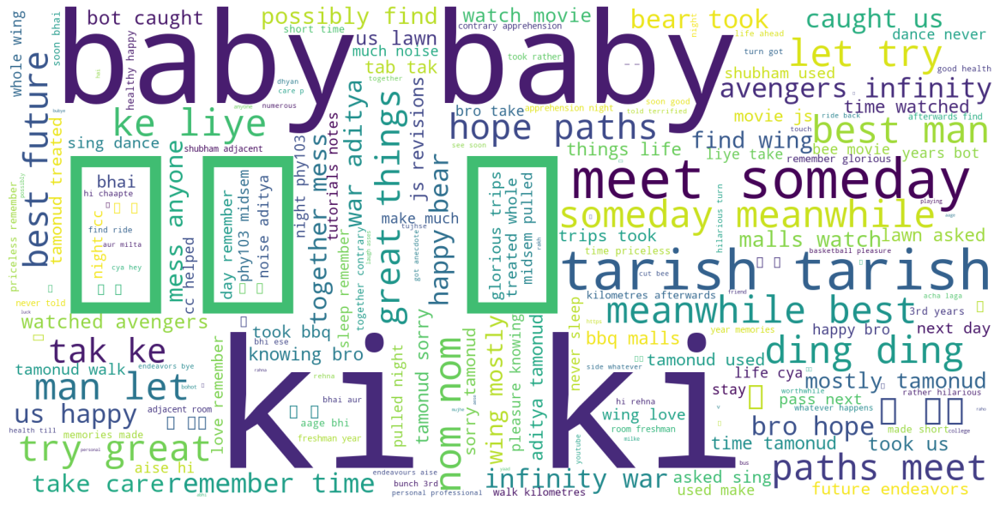

In [31]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
comment_words = ""
# f = open("/media/ayush/DATA/Codes/yearbook/hinglishStopwords.txt", "r")
# hinglish_stopwords = f.read().split()
# set(hinglish_stopwords)
# stopwords.update(hinglish_stopwords)
for val in wordSeries:
    # typecaste each val to string
    val = str(val)
    val = val.replace('/n', '')
    # split the value
    
    tokens = val.split()
#     # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 1600, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 1).generate(comment_words)
plt.figure(figsize = (16, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

# Gender mapping

In [32]:
authorData = df.groupby('author').recipient_gender.value_counts()
recipientData = df.groupby('recipient_name').author_gender.value_counts()

In [33]:
persons = []
for x in recipientData.index:
    persons.append(x[0])
genderNameMapping = {}
for i, g in zip(df.author, df.author_gender):    genderNameMapping[i] = g
for i, g in zip(df.recipient_name, df.recipient_gender):    genderNameMapping[i] = g
print(genderNameMapping)

{'Neil Rajiv Shirude': 'M', 'Aaishi  Ashirbad': 'M', 'Aaiyush  Kapurwan': 'M', 'Aakarsh  Singh': 'M', 'Aakash  Khandelwal': 'M', 'Aamir Ahmad Makki': 'M', 'Aayush  Ostwal': 'M', 'Aayush  Saini': 'M', 'Aayush  Sharma': 'M', 'Abha  Tamrakar': 'F', 'Abhay  Varshney': 'M', 'Abhijaat Ashish Kotamkar': 'M', 'Abhijeet': 'M', 'Abhinav  Ankit': 'M', 'Abhinav  Bende': 'M', 'Abhishek  Anand': 'M', 'Abhishek  Bhatia': 'M', 'Abhishek  Gupta': 'M', 'Abhishek  Maddheshiya': 'M', 'Abhishek  Saini': 'M', 'Abhishek  Sharma': 'M', 'Abhishek Gupta (N K Gupta)': 'M', 'Abhishek Singh Tindal': 'M', 'Abhishek Yadav (R S Yadav)': 'M', 'Abhyuday  Pandey': 'M', 'Achyut Kumar Verma': 'M', 'Adesh  Shukla': 'M', 'Aditya  Gulati': 'M', 'Aditya  Gupta': 'M', 'Aditya  Kalsha': 'M', 'Aditya  Mishra': 'M', 'Aditya  Raghuwanshi': 'M', 'Aditya  Sharma': 'M', 'Aditya  Singh': 'M', 'Aditya Abhaykirti Paikrao': 'M', 'Aditya Narayan Sarkar': 'M', 'Aditya Singh Rathore': 'M', 'Aditya': 'M', 'Aishwarya  Agrawal': 'M', 'Akash  G

In [34]:
genderStats = pd.DataFrame(index=list(set(persons)))
genderStats['authorGender'] = genderStats.index.map(genderNameMapping)                
sameGender = []
oppositeGender = []
for name, gender in zip(genderStats.index, genderStats.authorGender):
    print(name)
    sameGender_ = np.nan; oppositeGender_ = np.nan;
    if name in authorData.index:
        if gender=="M":
            if "F" in authorData[name]:
                oppositeGender_=authorData[name]["F"]
            if "M" in authorData[name]:
                sameGender_=authorData[name]["M"]
        if gender=="F":
            if "M" in authorData[name]:
                oppositeGender_=authorData[name]["M"]
            if "F" in authorData[name]:
                sameGender_=authorData[name]["F"]
    else:
        print("Has not written")
    sameGender.append(sameGender_)
    oppositeGender.append(oppositeGender_)
genderStats['sameGender'] = sameGender
genderStats['oppositeGender'] = oppositeGender
genderStats

Sandeep Kumar Meena
Saroj  Anjesh
Shivam Kumar (B P Singh)
Abhinav  Ankit
Aamir Ahmad Makki
Ashutosh  Ranjan
Aditya  Sharma
Vipin
Sudhanshu  Bansal
Swastik  Singhal
Deeksha  Yadav
Narendra  Mathuriya
Digumarthi Komal Emmanuel Raju
Kartik  Jangid
Saketh  Maddamsetty
Has not written
Avisha
Mohit  Kumar
Kumar  Shivam
Archies  Arck
Amitesh  Sachan
Naman  Roshan
Nikunj  Kothari
Ayush  Jain
Yatin  Azad
Ritesh  Naik
Shivam Kumar (B Kumar)
Tanishq  Patil
Gunjan  Jalori
Amrendra Pratap Singh
Ananya  Goswami
Kushagra  Gupta
Nalli  Bhavita
Manish Chandra Yadav
Avinash  Arya
Lakshay  Tyagi
Md Saquib Hussain
Naveen Kumar Meena
Jaya  Maheswari
Jetti Ramya Chowdary
Suprateek  Das
Ujjwal Pratap Singh
Subham Kumar Hota
Rakshit  Paurwal
Pranjal  Prashant
Piyush Sunil Samarth
Srajit  Kumar
Ravi  Kumar
Divyanshu  Sen
Sanidhya  Shah
Palak  Agrawal
Alan  Nair
Somesh Chandra Negi
Aviral  Shukla
Yash  Kumar
Jay  Gupta
Anshuman  Pal
Priyakhee  Kachari
Krishna  Deo
Jay  Mundra
Nimish  Agarwal
Shreyash  Ravi
Pre

,authorGender,sameGender,oppositeGender
Sandeep Kumar Meena,M,10.0,NaN
Saroj Anjesh,M,12.0,NaN
Shivam Kumar (B P Singh),M,19.0,1.0
Abhinav Ankit,M,18.0,NaN
Aamir Ahmad Makki,M,8.0,NaN
...,...,...,...
Anshika Verma,F,NaN,6.0
Sagnik Dey,M,9.0,NaN
Ishu Rajput,M,32.0,1.0
Akshat Tiwari,M,3.0,NaN


In [35]:
genderStats.sort_values(by='oppositeGender', ascending=False).head(40)

,authorGender,sameGender,oppositeGender
Ananya Goswami,F,8.0,88.0
Chitranshi Singh,F,43.0,71.0
Palak Agrawal,F,40.0,60.0
Maitreyee Srivastava,F,23.0,56.0
Monika Rathore,F,15.0,54.0
Anchal Singh,F,20.0,53.0
Gunjan Jalori,F,14.0,47.0
Avani Shrivastava,F,20.0,43.0
Shobhit Sachan,M,59.0,42.0
Dishaa Rajora,F,18.0,41.0


Text(0.5, 1.0, 'Females')

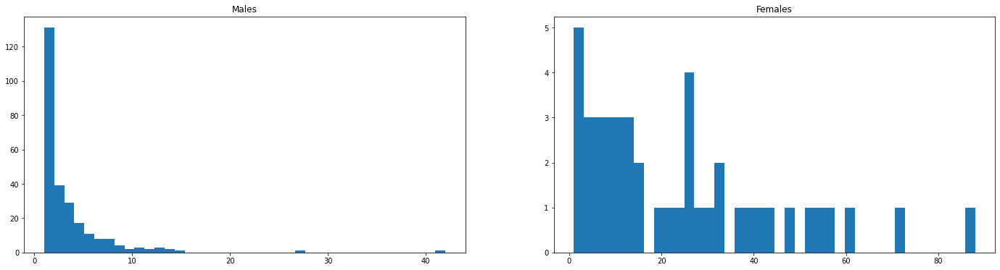

In [36]:
plt.figure(figsize=(24,6))
plt.subplot(1,2,1)
plt.hist(genderStats[genderStats.authorGender=='M']['oppositeGender'], bins=40)
plt.title("Males")
plt.subplot(1,2,2)
plt.hist(genderStats[genderStats.authorGender=='F']['oppositeGender'], bins=40)
plt.title("Females")

In [92]:
df[df.author=="Pratham  Shukla"].head(50)

,text,author,visibility,_id,recipient_name,author_roll,recipient_roll,author_gender,recipient_gender
7932,"bhatia bitch, milo kabhi phirse rr karne khikhikhi",Pratham Shukla,True,60c1c3eb659165b3aa645513,Abhishek Bhatia,170497,170022,M,M
7933,"Sontha-lay-aah! \nRight from linguistics ki subah wali class to the rest of the day, kitna saara time spend kiya hai first year mei roz tumhare saath. Sabhi hangouts ko kaafi charming kar dete the tum. I can’t ever forget wo beAAWtifoolMATH (or something similar) wali evening lmfao, humara antaragni wala signature dance, and eco101 mayhem xD.\nWe have definitely grown apart, but thoda bhot text to kar hi lenge beech beech mei hehe, warna wo group to hai hi xD\nI am really very proud of you, and genuinely hope ki tum aise chill karte karte chappte raho.\nILU maxxxx <3\nAlso, less BT, more khikhi, okay?\n",Pratham Shukla,True,60c1c99b659165b3aa64552c,Aditya Sonthalia,170497,170060,M,M
7934,"Ahahahah baby doll!\nBade hi jolly aadmi ho tum yaar. Thanks for being around me251 mei lmaooo, and also during AC and Sharma ke very haraami courses xD. I'd really love to have more of those library nightouts.\nIssi tarah hasste hassaate raho <3\nAll the very best!",Pratham Shukla,True,60c1cb23659165b3aa645535,Akshay,170497,170073,M,M
7935,"Oooof ex-OC!\nI am so happy we could have a date before graduating xD. Warna to library mei MoS ke rone mei hi nikal jata samay. Bhot bhot dhanyawaad CWC ko sambhalne mei help karne ke liye. Starting wala time to kya hi hi tha lmao.\nAll the very best future ke liye! Itna subtly chaap deti hai xD.\nAlso poori zindagi text pe baby baby karte rahenge khikhikhi, okay?",Pratham Shukla,True,60c1d54a659165b3aa645580,Ananya Goswami,170497,170104,M,F
7936,"Ojhaaaaaaaa! Bro, I think we met during you guys ki pclub winter. Then one thing led to another and I have no clue how it all ended up in a one-night stand xD. Uske baad kuch nahi yaad - seedha cut to sexy nights in Goa lmao.\nI am SO stunned ki tum itne nonchalant way mei itne bakchod ho. Very cool guy and amaze amaze person. Agle kuch mahine regularly text karunga khikhikhi.\nAnd all the best zindagi ke liye <3 <3",Pratham Shukla,True,60c250f6659165b3aa645f7f,Anirudh Anil Ojha,170497,170116,M,M
7937,"Hey bebe,\nSo I guess there’s one thing we should be thankful to burger for - she got us talking ache se. And I kid you not, I couldn’t have been happier to have found another person who appreciates cringe and is a big time chaisexual xD. I sometimes wonder why we get along well, even when we don’t agree on most things. Nevertheless, I am happy that we do. :))\nIt’s been a fun time with you - most of all, comm, your soiree, and the very dope Antaragni. I wish we could have more of the latter two. You’ve been a very good friend and an amazing company through this disastrous department. I might actually miss some of it xD. But yeah man, I am really thankful that you stuck around - made the last semesters on campus very awesome.\nI hope you keep killing at your workplace like you always do, and go thodu sa easy on yourself. Try forgetting me ever, and your life will turn into me361. Also stop wearing that tee with ande.\n",Pratham Shukla,True,60c1d603659165b3aa645588,Anish Saxena,170497,170118,M,M
7938,pls change your name to Ankur Fucks xD\nAll the very best bro! Bakchod aadmi ho tum,Pratham Shukla,True,60c1d661659165b3aa645590,Ankur Vatsa,170497,170129,M,M
7939,"Hi Priya xD\nDekho S1 mei Ned Stark died, and S3 mei the rest of the Starks. Also S6 mei Jon Snow zinda ho jata hai. Last mei, Daenerys turns out a bitch and wo lodu Brandon Stark gets the throne.\nYaar Anshika, tu bhot cute and charming hai. I really cherish first year wale hangouts and random bulla with chai in CCD ke peeche wali canteen.\nPlease aise hi qhqhqhq karke hasste raho, and all the very best zindagi ke liye. <3 <3",Pratham Shukla,True,60c1d777659165b3aa64559f,Anshika Verma,170497,170131,M,F
7940,Anugaand baby <3 <3,Pratham Shukla,True,60c1d79b659165b3aa6

In [85]:
df[(df.recipient_gender=="F") & (df.author_gender=="M")].reset_index()[600:649]

,index,text,author,visibility,_id,recipient_name,author_roll,recipient_roll,author_gender,recipient_gender
600,8303,Yo Avisha\nAlways be the cheerful and lively soul as you are\nAnd bhand hone ke baad phone haath me nahi lene ka XD\nAll the best future ke liye :),Pulkit Pandey,True,60a63f21819323d199d48cb4,Avisha,170516,170185,M,F
601,8308,Nice dp,Pulkit Pandey,False,60781063c5325f8b69d16977,Deeksha Yadav,170516,170230,M,F
602,8309,https://youtu.be/NUYvbT6vTPs\n,Pulkit Pandey,True,60876bb9819323d199d46e42,Deeksha Yadav,170516,170230,M,F
603,8310,"Henlo,\nStarting with ""Laut aao 2nd year wali diksha""\nWe first met before the trip to delhi ig, and that time I had no clue how important role you'll play in my college life. Since then we had so many trips, so many up downs, and of course you have changed by miles, but still I believe we share a great bond :p\nSince you know it is impossible to encapsulate all those memories we made, I'll leave this memoir with a few positive words. Since I can boast off the fact that I have known you the best all these years XD, you were really one of those sweet and simple girls everyone would admire. I was well there though to witness the third year transition to your ""Angry Goddess"" role, and the final year wala introvert mode bhi, but over all those years, your empathy and kindness for others didn't change, which I am extremely proud of.\nYou know I am very bad at expressing emotions, hence I would just like to thank you for the innumerous times you've helped me, and for those innumerous memories throughout the life at IITK.\nAnd no, I won't kill you XD\nRegards\nPull K Yeet",Pulkit Pandey,True,60a50e90819323d199d48330,Deeksha Yadav,170516,170230,M,F
604,8333,Cantt > Sonatalab\nOffice > Friends\n:),Pulkit Pandey,True,60808c4c819323d199d46d40,Maitreyee Srivastava,170516,170371,M,F
605,8341,>.<,Pulkit Pandey,True,607c8bc3b38952bbfbc68d0b,Pragya Patel,170516,170477,M,F
606,8342,Halo pulici,Pulkit Pandey,True,60ba19bd659165b3aa644fb0,Pragya Patel,170516,170477,M,F
607,8347,"Yo Pratigya\nThanks to Aero we shared lots of groups together :p, and you were always friendly and helpful. Thanks for being that kind of positive person and remain like this for ever\nFrom Creed XD",Pulkit Pandey,True,60a4b810819323d199d481b0,Pratigya Tomar,170516,170499,M,F
608,8354,"Henlo cheems fan , and a fellow dog lover. Thanks for being a gentle friend always,and always keep up your cheerful nature.\nPS: Hoping one day you feature as well on emo bois 😋. Heckin bamboozled",Pulkit Pandey,True,609ff560819323d199d47b56,Raj Nandini,170516,170534,M,F
609,8393,"Arzoo, sorry for disturbing everyday when you were in our wing :p, kya kre MTH akele se ho nahi paati 😛. Had a lot of fun with you in Goa. AmEx ka ek credit card gift kr de 😛\nALSO I know what you used to call me :p\nP.S. - Drunk Arzoo can't stand on her feet but can walk in a straight line XD\n",Raghav Maheshwari,True,60b25c03659165b3aa644ed4,Arzoo,170520,170154,M,F


In [23]:
df[(df.author.isin(["Anshika  Verma"]))]

,text,author,visibility,_id,recipient_name,author_roll,recipient_roll,author_gender,recipient_gender
2532,"Sonthalia, \n\nKnown you for 4 years now. You are the one person who has been a constant and has supported me through every phase of my campus life, literally everything. We have had some amazing time together and I would always cherish what we had. You have dealt with all the cranky me during exams, indecisive me on what to eat, lazy me for attending classes, and much more. Whatever I write or say will not do justice to how nice you have been to me. \n\nIt’s amazing that we could pull off the Udaipur and Goa trip. I think I would always feel comfortable reaching out to you and I hope you feel the same. \n\nMutton kebab paratha and Mughlai chicken for life, eh? \nAlso Typing....""Hey, what is the attendance policy of this course?"" xD",Anshika Verma,True,60cfa022659165b3aa646904,Aditya Sonthalia,170131,170060,F,M
2533,"Awwnawwnaww, \n\nSo, you are the first person I approached to help me with my insomnia by just moving that bed table and being all cute about allowing me to sleep there next to you. You introduced me to The Office, so I owe you fo sho. You were my 3 am 3rd floor RO water fetching buddy. Also, you are the cutest when tickled while sleeping( take note bf xD). It has been so easy with you, I could just barge into your room and spend hours. You have been so comforting and understanding through everything. You were there for all those walks and discussions when I needed someone the most and I'll be there for you too. \n\nThe moment we got that intern call, hugs when drunk, giving a quiz while sleeping, random knocks at my door to just check on me will stay with me forever. \n\nJim Halpert to my Prison Mike. <3 \n\nPS: Morning hugs from Monica are a treat. \n\nAnd, I love you!",Anshika Verma,True,60cf89d2659165b3aa646876,Ananya Goswami,170131,170104,F,F
2534,Hey! It was nice meeting you all. Special shoutout to those squishy little things.,Anshika Verma,False,608c9af7819323d199d475d3,Anirudh Anil Ojha,170131,170116,F,M
2535,To Wanna be HEC\n Sexy Sexy hall 3! \n - Work in progress\n,Anshika Verma,False,608ca0f0819323d199d475d4,Anirudh Anil Ojha,170131,170116,F,M
2536,baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby baby,Anshika Verma,False,608d67fe819323d199d4765d,Anirudh Anil Ojha,170131,170116,F,M
2537,"Suck my dick, Morty!!!!",Anshika Verma,True,60a3a16c819323d199d47f11,Anirudh Anil Ojha,170131,170116,F,M
2538,"Hey cute bitch, \nI am so torn between the beard vs shaved look.\nKill me\nstr.replace(""l"",""s"")\n",Anshika Verma,False,60a7b596819323d199d492a5,Anirudh Anil Ojha,170131,170116,F,M
2539,Speak into the mic.,Anshika Verma,False,60a8271c819323d199d49378,Anirudh Anil Ojha,170131,170116,F,M
2540,"Heyyy Neil, \n\nI was very skeptical about working with a new person. Also, to top that you had this OCD for organizing the google drive, sorting the footnote, header, mails, everything. But even in the beginning, the good cop/bad cop manager interviews gave me the taste that it will be an interesting journey with you. You were such a balance to my skills that everything became so easy to manage. \n\nHow scared were you when we had that meeting with DoRA in the evening and I wasn't picking up your call until half an hour before it? I can't laugh enough at this one. XD \nShould have written XD after every statement, no? \n\n Honestly, I was extremely disappointed that you couldn't come to Goa. Humne toh itin

In [19]:
df.groupby('author').count().text.sort_values(ascending=False)[:50]

author
Ram  Goyal                        195
Mahajan Dipak Anil                139
Chitranshi  Singh                 135
Kushagra  Gupta                   117
Ananya  Goswami                   116
Ayush Hitesh Soneria              110
Pulkit  Pandey                    109
Shobhit  Sachan                   105
Yogeshwar                         104
Prateek  Varshney                 100
Palak  Agrawal                    100
Harish  Dechiraju                  95
Mataria Pence Jagatkumar           91
Chandra  Vaibhav                   89
Ratnesh  Argal                     87
Divyansh  Tripathi                 84
Jai Ranjan Sharma                  81
Gunjan  Jalori                     80
Maitreyee  Srivastava              78
Yash  Maheshwari                   77
Narendra  Mathuriya                76
Dewansh Kr. Singh                  76
Ayush  Sharma                      75
Anchal  Singh                      75
Deeksha  Yadav                     72
Krishan  Kumar                     72
Monik